In [ ]:
!pip install ez_setup imageio-ffmpeg

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 26.9 MB 5.7 MB/s 
  Created wheel for ez-setup: filename=ez_setup-0.9-py3-none-any.whl size=11015 sha256=80455cf8c2667b83aa4a69709a7e251b29bf6f41ecf95585e3fd3dfb354fcf89
  Stored in directory: /root/.cache/pip/wheels/f4/78/bd/f88c8eddfd5a8bf2a029e5cd8bc7a9914597002b081a000ffe
Successfully built ez-setup


In [ ]:
!pip install youtube-dl
!pip install git+https://github.com/TahaAnwar/pafy.git#egg=pafy

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
  Cloning https://github.com/TahaAnwar/pafy.git to /tmp/pip-install-bovmd186/pafy_d3137c9a90df44569e812b3aac898fc3
  Running command git clone -q https://github.com/TahaAnwar/pafy.git /tmp/pip-install-bovmd186/pafy_d3137c9a90df44569e812b3aac898fc3


In [ ]:
!pip install moviepy==1.0.3

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 388 kB 4.3 MB/s 
  Created wheel for moviepy: filename=moviepy-1.0.3-py3-none-any.whl size=110743 sha256=2fae6dd6e6880097a3223ad2020998135904adc666ee11a8a1a20031ce7e9dcc
  Stored in directory: /root/.cache/pip/wheels/56/dc/2b/9cd600d483c04af3353d66623056fc03faed76b7518faae4df
Successfully built moviepy
  Attempting uninstall: moviepy
    Found existing installation: moviepy 0.2.3.5
    Uninstalling moviepy-0.2.3.5:
      Successfully uninstalled moviepy-0.2.3.5


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
import os
import cv2
import math
import pafy
import random
import numpy as np
import datetime as dt
import tensorflow as tf
from moviepy.editor import *
from collections import deque
import matplotlib.pyplot as plt
%matplotlib inline

from sklearn.model_selection import train_test_split

from tensorflow.keras.layers import *
from tensorflow.keras.models import Sequential
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras.utils import plot_model

In [ ]:
from tensorflow.keras.models import load_model

In [ ]:
seed_constant = 23
np.random.seed(seed_constant)
random.seed(seed_constant)
tf.random.set_seed(seed_constant)

In [ ]:
%%capture
!unrar x /content/drive/MyDrive/Projects/Action_Recogn/data.rar

## Dataset

MIME:


*   Largest and most diverse ever demonstrations dataset 
*   8260 human - robot demonstrations
*   20 Tasks

https://sites.google.com/view/mimedataset/dataset

Every datapoint in the dataset contains:
*   Human demonstration (HD)
*   Head mounted kinect (RGBD)
*   Robot demonstration (RD) 
*   Overhead mounted Kinect (RGBD)
*   2 Soft kinetic sensors mounted on cuffs (RGBD)
*   Joint angle data from Baxter

The Directory of Tasks:

Pour, Stir, Pass, Stack, Place objects in box, Open Bottles, Push, Rotate, Wipe, Press Buttons, Close Book, Picking (single hand), Picking (both hands), Poke, Pull  (two hands), Push (two hands), Toy Car Trajectories, Roll, Drop Objects, Pull (Single hand)



Download hd_kinect_rgb.mp4, rd_kinect_rgb.mp4 

{hd - Human Demonstration and rd -  Robot Demonstration }

(30+30)

total = 60*4 = 240 videos

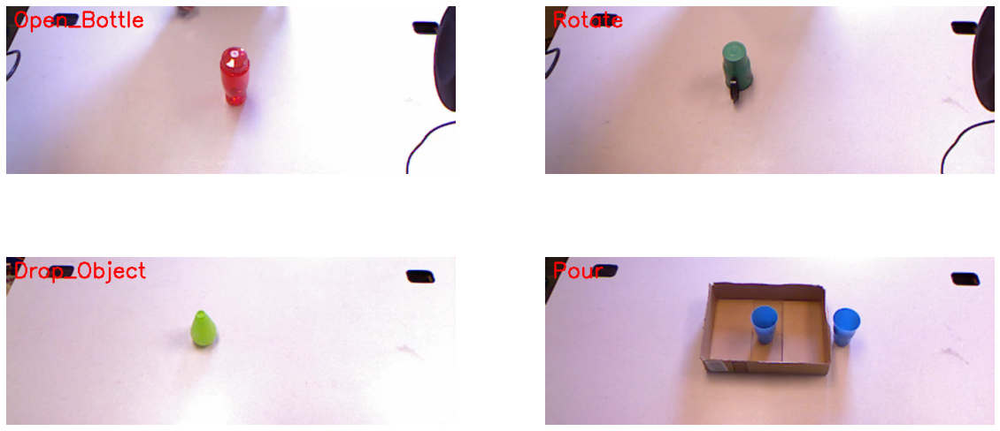

In [ ]:
# Create a Matplotlib figure
plt.figure(figsize = (20, 20))

# Get Names of all classes in Data
all_classes_names = os.listdir('/content/data/')

# Generate a random sample of images each time the cell runs
random_range = random.sample(range(len(all_classes_names)), 4)

# Iterating through all the random samples
for counter, random_index in enumerate(random_range, 1):

    # Getting Class Name using Random Index
    selected_class_Name = all_classes_names[random_index]

    # Getting a list of all the video files present in a Class Directory
    video_files_names_list = os.listdir(f'data/{selected_class_Name}/')

    # Randomly selecting a video file
    selected_video_file_name = random.choice(video_files_names_list)

    # Reading the Video File Using the Video Capture
    video_reader = cv2.VideoCapture(f'data/{selected_class_Name}/{selected_video_file_name}')
    
    # Reading The First Frame of the Video File
    _, bgr_frame = video_reader.read()

    # Closing the VideoCapture object and releasing all resources. 
    video_reader.release()

    # Converting the BGR Frame to RGB Frame 
    rgb_frame = cv2.cvtColor(bgr_frame, cv2.COLOR_BGR2RGB)

    # Adding The Class Name Text on top of the Video Frame.
    cv2.putText(rgb_frame, selected_class_Name, (10, 30), cv2.FONT_HERSHEY_SIMPLEX, 1, (255, 0, 0), 2)
    
    # Assigning the Frame to a specific position of a subplot
    plt.subplot(4, 2, counter)
    plt.imshow(rgb_frame)
    plt.axis('off')

In [ ]:
image_height, image_width = 64, 64
# max_images_per_class = 1500

SEQUENCE_LENGTH = 50
max_images_per_class = 1500

dataset_directory = "data"
classes_list = ["Drop_Object", "Open_Bottle","Pour", "Rotate"]

model_output_size = len(classes_list)

# Simple CNN

## Data Loading and preprocessing

In [ ]:
def frames_extraction(video_path):
    # Empty List declared to store video frames
    frames_list = []
    
    # Reading the Video File Using the VideoCapture
    video_reader = cv2.VideoCapture(video_path)

    # Iterating through Video Frames
    # while True:

    #     # Reading a frame from the video file 
    #     success, frame = video_reader.read() 

    #     # If Video frame was not successfully read then break the loop
    #     if not success:
    #         break

    #     # Resize the Frame to fixed Dimensions
    #     resized_frame = cv2.resize(frame, (image_height, image_width))
        
    #     # Normalize the resized frame by dividing it with 255 so that each pixel value then lies between 0 and 1
    #     normalized_frame = resized_frame / 255
        
    #     # Appending the normalized frame into the frames list
    #     frames_list.append(normalized_frame)
    
    # # Closing the VideoCapture object and releasing all resources. 
    # video_reader.release()




    video_frames_count = int(video_reader.get(cv2.CAP_PROP_FRAME_COUNT))
    skip_frames_window = max(int(video_frames_count/SEQUENCE_LENGTH), 1)

    # Iterate through the Video Frames.
    for frame_counter in range(SEQUENCE_LENGTH):

        # Set the current frame position of the video.
        video_reader.set(cv2.CAP_PROP_POS_FRAMES, frame_counter * skip_frames_window)

        # Reading the frame from the video. 
        success, frame = video_reader.read() 

        # Check if Video frame is not successfully read then break the loop
        if not success:
            break

        # Resize the Frame to fixed height and width.
        resized_frame = cv2.resize(frame, (image_height, image_width))
        
        # Normalize the resized frame by dividing it with 255 so that each pixel value then lies between 0 and 1
        normalized_frame = resized_frame / 255
        
        # Append the normalized frame into the frames list
        frames_list.append(normalized_frame)
    
    # Closing the VideoCapture object and releasing all resources. 
    video_reader.release()





    # returning the frames list 
    return frames_list

In [ ]:
def create_dataset():

    # Declaring Empty Lists to store the features and labels values.
    temp_features = [] 
    features = []
    labels = []
    
    # Iterating through all the classes mentioned in the classes list
    for class_index, class_name in enumerate(classes_list):
        print(f'Extracting Data of Class: {class_name}')
        
        # Getting the list of video files present in the specific class name directory
        files_list = os.listdir(os.path.join(dataset_directory, class_name))

        # Iterating through all the files present in the files list
        for file_name in files_list:

            # Construct the complete video path
            video_file_path = os.path.join(dataset_directory, class_name, file_name)

            # Calling the frame_extraction method for every video file path
            frames = frames_extraction(video_file_path)

            # Appending the frames to a temporary list.
            temp_features.extend(frames)
        
        # Adding randomly selected frames to the features list
        features.extend(random.sample(temp_features, max_images_per_class))

        # Adding Fixed number of labels to the labels list
        labels.extend([class_index] * max_images_per_class)
        
        # Emptying the temp_features list so it can be reused to store all frames of the next class.
        temp_features.clear()

    # Converting the features and labels lists to numpy arrays
    features = np.asarray(features)
    labels = np.array(labels)  

    return features, labels

In [ ]:
features, labels = create_dataset()

Extracting Data of Class: Drop_Object
Extracting Data of Class: Open_Bottle
Extracting Data of Class: Pour
Extracting Data of Class: Rotate


In [ ]:
# Using Keras's to_categorical method to convert labels into one-hot-encoded vectors
one_hot_encoded_labels = to_categorical(labels)

In [ ]:
features_train, features_test, labels_train, labels_test = train_test_split(features, one_hot_encoded_labels,
                                                                            test_size = 0.2, shuffle = True, 
                                                                            random_state = seed_constant)

In [ ]:
print(features_train.shape, features_test.shape, labels_train.shape, labels_test.shape)

(4800, 64, 64, 3) (1200, 64, 64, 3) (4800, 4) (1200, 4)


## Training

In [ ]:
# Let's create a function that will construct our model
def create_model():

    # We will use a Sequential model for model construction
    model = Sequential()

    # Defining The Model Architecture
    model.add(Conv2D(filters = 64, kernel_size = (3, 3), activation = 'relu', input_shape = (image_height, image_width, 3)))
    model.add(Dropout(0.2))
    model.add(Conv2D(filters = 64, kernel_size = (3, 3), activation = 'relu'))
    model.add(Dropout(0.2))
    model.add(BatchNormalization())
    model.add(MaxPooling2D(pool_size = (2, 2)))
    model.add(GlobalAveragePooling2D())
    model.add(Dense(256, activation = 'relu'))
    model.add(BatchNormalization())
    model.add(Dense(model_output_size, activation = 'softmax'))

    # Printing the models summary
    model.summary()

    return model


# Calling the create_model method
model = create_model()

print("Model Created Successfully!")

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 62, 62, 64)        1792      
                                                                 
 dropout (Dropout)           (None, 62, 62, 64)        0         
                                                                 
 conv2d_1 (Conv2D)           (None, 60, 60, 64)        36928     
                                                                 
 dropout_1 (Dropout)         (None, 60, 60, 64)        0         
                                                                 
 batch_normalization (BatchN  (None, 60, 60, 64)       256       
 ormalization)                                                   
                                                                 
 max_pooling2d (MaxPooling2D  (None, 30, 30, 64)       0         
 )                                                      

In [ ]:
# Adding Early Stopping Callback
early_stopping_callback = EarlyStopping(monitor = 'val_loss', patience = 5, mode = 'min', restore_best_weights = True)

# Adding loss, optimizer and metrics values to the model.
model.compile(loss = 'categorical_crossentropy', optimizer = 'Adam', metrics = ["accuracy"])

# Start Training
model_training_history = model.fit(x = features_train, y = labels_train, epochs = 50, batch_size = 10 , shuffle = True, validation_split = 0.2, callbacks = [early_stopping_callback])

Epoch 1/50
384/384 [==============================] - 180s 466ms/step - loss: 0.9413 - accuracy: 0.6089 - val_loss: 2.9976 - val_accuracy: 0.2479
Epoch 2/50
384/384 [==============================] - 141s 368ms/step - loss: 0.6474 - accuracy: 0.7419 - val_loss: 8.4628 - val_accuracy: 0.3187
Epoch 3/50
384/384 [==============================] - 139s 362ms/step - loss: 0.5243 - accuracy: 0.8023 - val_loss: 6.8992 - val_accuracy: 0.2927
Epoch 4/50
384/384 [==============================] - 138s 360ms/step - loss: 0.4427 - accuracy: 0.8323 - val_loss: 1.5747 - val_accuracy: 0.6510
Epoch 5/50
384/384 [==============================] - 139s 362ms/step - loss: 0.3977 - accuracy: 0.8544 - val_loss: 0.3130 - val_accuracy: 0.8906
Epoch 6/50
384/384 [==============================] - 141s 368ms/step - loss: 0.3714 - accuracy: 0.8724 - val_loss: 0.9338 - val_accuracy: 0.6948
Epoch 7/50
384/384 [==============================] - 142s 369ms/step - loss: 0.3347 - accuracy: 0.8807 - val_loss: 2.4146 -

## Model Prediction

In [ ]:
model_evaluation_history = model.evaluate(features_test, labels_test)

38/38 [==============================] - 8s 203ms/step - loss: 0.3262 - accuracy: 0.8933


In [ ]:
def plot_metric(metric_name_1, metric_name_2, plot_name):
  # Get Metric values using metric names as identifiers
  metric_value_1 = model_training_history.history[metric_name_1]
  metric_value_2 = model_training_history.history[metric_name_2]

  # Constructing a range object which will be used as time 
  epochs = range(len(metric_value_1))
  
  # Plotting the Graph
  plt.plot(epochs, metric_value_1, 'blue', label = metric_name_1)
  plt.plot(epochs, metric_value_2, 'red', label = metric_name_2)
  
  # Adding title to the plot
  plt.title(str(plot_name))

  # Adding legend to the plot
  plt.legend()

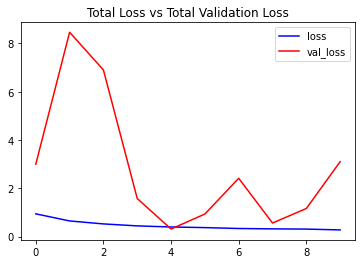

In [ ]:
plot_metric('loss', 'val_loss', 'Total Loss vs Total Validation Loss')

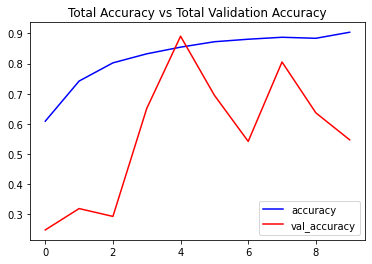

In [ ]:
plot_metric('accuracy', 'val_accuracy', 'Total Accuracy vs Total Validation Accuracy')

In [ ]:
# model_evaluation_loss, model_evaluation_accuracy = model_evaluation_history
# model_name = f'/content/drive/MyDrive/Projects/Action_Recogn/simple_cnn_Action_Classification___Loss_{model_evaluation_loss}___Accuracy_{model_evaluation_accuracy}.h5'
model_name = f'/content/drive/MyDrive/Projects/Action_Recogn/simple_cnn_Action_Classification__{SEQUENCE_LENGTH}_maxImgPerClass_{max_images_per_class}__{image_height}_{image_width}.h5'



In [ ]:
# Saving your Model
model.save(model_name)

In [ ]:
model = load_model(model_name)

## Testing on video

In [ ]:
# from moviepy.editor import *
dataset_directory = "/content/drive/MyDrive/Projects/Action_Recogn/test"
list1 = ["hd", "rd"]
clips = []
i=0
for class_index, class_name in enumerate(list1):
    files_list = os.listdir(os.path.join(dataset_directory, class_name))
    for file_name in files_list:
        video_file_path = os.path.join(dataset_directory, class_name, file_name)
        clip = VideoFileClip(video_file_path)
        if i<4:
            clip1 = clip.subclip(0, 10)
        else:
            clip1 = clip.subclip(0, 40) 
        clips.append(clip1)
        i += 1

final = concatenate_videoclips(clips)
# final = CompositeVideoClip(clips)
final.write_videofile("/content/drive/MyDrive/Projects/Action_Recogn/test_video.mp4")
# showing final clip
final.ipython_display(width = 480, maxduration = 240)

In [ ]:
def predict_on_video(video_file_path, output_file_path, window_size):

    # Initialize a Deque Object with a fixed size which will be used to implement moving/rolling average functionality.
    predicted_labels_probabilities_deque = deque(maxlen = window_size)

    # Reading the Video File using the VideoCapture Object
    video_reader = cv2.VideoCapture(video_file_path)

    # Getting the width and height of the video 
    original_video_width = int(video_reader.get(cv2.CAP_PROP_FRAME_WIDTH))
    original_video_height = int(video_reader.get(cv2.CAP_PROP_FRAME_HEIGHT))

    # Writing the Overlayed Video Files Using the VideoWriter Object
    video_writer = cv2.VideoWriter(output_file_path, cv2.VideoWriter_fourcc('M', 'P', '4', 'V'), 24, (original_video_width, original_video_height))

    while True: 

        # Reading The Frame
        status, frame = video_reader.read() 

        if not status:
            break

        # Resize the Frame to fixed Dimensions
        resized_frame = cv2.resize(frame, (image_height, image_width))
        
        # Normalize the resized frame by dividing it with 255 so that each pixel value then lies between 0 and 1
        normalized_frame = resized_frame / 255

        # Passing the Image Normalized Frame to the model and receiving Predicted Probabilities.
        predicted_labels_probabilities = model.predict(np.expand_dims(normalized_frame, axis = 0))[0]

        # Appending predicted label probabilities to the deque object
        predicted_labels_probabilities_deque.append(predicted_labels_probabilities)

        # Assuring that the Deque is completely filled before starting the averaging process
        if len(predicted_labels_probabilities_deque) == window_size:

            # Converting Predicted Labels Probabilities Deque into Numpy array
            predicted_labels_probabilities_np = np.array(predicted_labels_probabilities_deque)

            # Calculating Average of Predicted Labels Probabilities Column Wise 
            predicted_labels_probabilities_averaged = predicted_labels_probabilities_np.mean(axis = 0)

            # Converting the predicted probabilities into labels by returning the index of the maximum value.
            predicted_label = np.argmax(predicted_labels_probabilities_averaged)

            # Accessing The Class Name using predicted label.
            predicted_class_name = classes_list[predicted_label]
          
            # Overlaying Class Name Text Ontop of the Frame
            cv2.putText(frame, predicted_class_name, (10, 30), cv2.FONT_HERSHEY_SIMPLEX, 1, (0, 0, 255), 2)

        # Writing The Frame
        video_writer.write(frame)


        # cv2.imshow('Predicted Frames', frame)

        # key_pressed = cv2.waitKey(10)

        # if key_pressed == ord('q'):
        #     break

    # cv2.destroyAllWindows()

    
    # Closing the VideoCapture and VideoWriter objects and releasing all resources held by them. 
    video_reader.release()
    video_writer.release()

In [ ]:
# Creating The Output directories if it does not exist
output_directory = '/content/drive/MyDrive/Projects/Action_Recogn/test_output'
os.makedirs(output_directory, exist_ok = True)

video_title = "test_video"
input_video_file_path = f'/content/drive/MyDrive/Projects/Action_Recogn/{video_title}.mp4'

In [ ]:
# Setting sthe Window Size which will be used by the Rolling Average Proces
window_size = 1

# Constructing The Output YouTube Video Path
output_video_file_path = f'{output_directory}/{video_title} -Output-WSize {window_size}__simple_cnn__{SEQUENCE_LENGTH}_maxImgPerClass_{max_images_per_class}__{image_height}_{image_width}.mp4'

# Calling the predict_on_live_video method to start the Prediction.
predict_on_video(input_video_file_path, output_video_file_path, window_size)

# Play Video File in the Notebook
VideoFileClip(output_video_file_path).ipython_display(width = 700, maxduration = 240)

Moviepy - Building video __temp__.mp4.
Moviepy - Writing video __temp__.mp4



Moviepy - Done !
Moviepy - video ready __temp__.mp4


In [ ]:
# Setting sthe Window Size which will be used by the Rolling Average Proces
window_size = 5

# Constructing The Output YouTube Video Path
output_video_file_path = f'{output_directory}/{video_title} -Output-WSize {window_size}__simple_cnn__{SEQUENCE_LENGTH}_maxImgPerClass_{max_images_per_class}__{image_height}_{image_width}.mp4'

# Calling the predict_on_live_video method to start the Prediction.
predict_on_video(input_video_file_path, output_video_file_path, window_size)

# Play Video File in the Notebook
VideoFileClip(output_video_file_path).ipython_display(width = 700, maxduration = 240)

Moviepy - Building video __temp__.mp4.
Moviepy - Writing video __temp__.mp4



Moviepy - Done !
Moviepy - video ready __temp__.mp4


In [ ]:
# Setting sthe Window Size which will be used by the Rolling Average Proces
window_size = 10

# Constructing The Output YouTube Video Path
output_video_file_path = f'{output_directory}/{video_title} -Output-WSize {window_size}__simple_cnn__{SEQUENCE_LENGTH}_maxImgPerClass_{max_images_per_class}__{image_height}_{image_width}.mp4'

# Calling the predict_on_live_video method to start the Prediction.
predict_on_video(input_video_file_path, output_video_file_path, window_size)

# Play Video File in the Notebook
VideoFileClip(output_video_file_path).ipython_display(width = 700, maxduration = 240)

Moviepy - Building video __temp__.mp4.
Moviepy - Writing video __temp__.mp4



Moviepy - Done !
Moviepy - video ready __temp__.mp4


# ConvLSTM Approach

In [ ]:
def frames_extraction(video_path):
    '''
    This function will extract the required frames from a video after resizing and normalizing them.
    Args:
        video_path: The path of the video in the disk, whose frames are to be extracted.
    Returns:
        frames_list: A list containing the resized and normalized frames of the video.
    '''

    # Declare a list to store video frames.
    frames_list = []
    
    # Read the Video File using the VideoCapture object.
    video_reader = cv2.VideoCapture(video_path)

    # Get the total number of frames in the video.
    video_frames_count = int(video_reader.get(cv2.CAP_PROP_FRAME_COUNT))

    # Calculate the the interval after which frames will be added to the list.
    skip_frames_window = max(int(video_frames_count/SEQUENCE_LENGTH), 1)

    # Iterate through the Video Frames.
    for frame_counter in range(SEQUENCE_LENGTH):

        # Set the current frame position of the video.
        video_reader.set(cv2.CAP_PROP_POS_FRAMES, frame_counter * skip_frames_window)

        # Reading the frame from the video. 
        success, frame = video_reader.read() 

        # Check if Video frame is not successfully read then break the loop
        if not success:
            break

        # Resize the Frame to fixed height and width.
        resized_frame = cv2.resize(frame, (image_height, image_width))
        
        # Normalize the resized frame by dividing it with 255 so that each pixel value then lies between 0 and 1
        normalized_frame = resized_frame / 255
        
        # Append the normalized frame into the frames list
        frames_list.append(normalized_frame)
    
    # Release the VideoCapture object. 
    video_reader.release()

    # Return the frames list.
    return frames_list

In [ ]:
def create_dataset():
    '''
    This function will extract the data of the selected classes and create the required dataset.
    Returns:
        features:          A list containing the extracted frames of the videos.
        labels:            A list containing the indexes of the classes associated with the videos.
        video_files_paths: A list containing the paths of the videos in the disk.
    '''

    # Declared Empty Lists to store the features, labels and video file path values.
    features = []
    labels = []
    video_files_paths = []
    
    # Iterating through all the classes mentioned in the classes list
    for class_index, class_name in enumerate(classes_list):
        
        # Display the name of the class whose data is being extracted.
        print(f'Extracting Data of Class: {class_name}')
        
        # Get the list of video files present in the specific class name directory.
        files_list = os.listdir(os.path.join(dataset_directory, class_name))
        
        # Iterate through all the files present in the files list.
        for file_name in files_list:
            
            # Get the complete video path.
            video_file_path = os.path.join(dataset_directory, class_name, file_name)

            # Extract the frames of the video file.
            frames = frames_extraction(video_file_path)

            # Check if the extracted frames are equal to the SEQUENCE_LENGTH specified above.
            # So ignore the vides having frames less than the SEQUENCE_LENGTH.
            if len(frames) == SEQUENCE_LENGTH:

                # Append the data to their repective lists.
                features.append(frames)
                labels.append(class_index)
                video_files_paths.append(video_file_path)

    # Converting the list to numpy arrays
    features = np.asarray(features)
    labels = np.array(labels)  
    
    # Return the frames, class index, and video file path.
    return features, labels, video_files_paths

In [ ]:
# Create the dataset.
features, labels, video_files_paths = create_dataset()

Extracting Data of Class: Drop_Object
Extracting Data of Class: Open_Bottle
Extracting Data of Class: Pour
Extracting Data of Class: Rotate


In [ ]:
# Using Keras's to_categorical method to convert labels into one-hot-encoded vectors
one_hot_encoded_labels = to_categorical(labels)

In [ ]:
features_train, features_test, labels_train, labels_test = train_test_split(features, one_hot_encoded_labels,
                                                                            test_size = 0.25, shuffle = True, 
                                                                            random_state = seed_constant)

In [ ]:
print(features_train.shape, features_test.shape, labels_train.shape, labels_test.shape)

(147, 50, 64, 64, 3) (49, 50, 64, 64, 3) (147, 4) (49, 4)


In [ ]:
def create_convlstm_model():
    '''
    This function will construct the required convlstm model.
    Returns:
        model: It is the required constructed convlstm model.
    '''

    # We will use a Sequential model for model construction
    model = Sequential()

    # Define the Model Architecture.
    ########################################################################################################################
    
    model.add(ConvLSTM2D(filters = 4, kernel_size = (3, 3), activation = 'tanh',data_format = "channels_last",
                         recurrent_dropout=0.2, return_sequences=True, input_shape = (SEQUENCE_LENGTH,
                                                                                      image_height, image_width, 3)))
    
    model.add(MaxPooling3D(pool_size=(1, 2, 2), padding='same', data_format='channels_last'))
    model.add(TimeDistributed(Dropout(0.2)))
    
    model.add(ConvLSTM2D(filters = 8, kernel_size = (3, 3), activation = 'tanh', data_format = "channels_last",
                         recurrent_dropout=0.2, return_sequences=True))
    
    model.add(MaxPooling3D(pool_size=(1, 2, 2), padding='same', data_format='channels_last'))
    model.add(TimeDistributed(Dropout(0.2)))
    
    model.add(ConvLSTM2D(filters = 14, kernel_size = (3, 3), activation = 'tanh', data_format = "channels_last",
                         recurrent_dropout=0.2, return_sequences=True))
    
    model.add(MaxPooling3D(pool_size=(1, 2, 2), padding='same', data_format='channels_last'))
    model.add(TimeDistributed(Dropout(0.2)))
    
    model.add(ConvLSTM2D(filters = 16, kernel_size = (3, 3), activation = 'tanh', data_format = "channels_last",
                         recurrent_dropout=0.2, return_sequences=True))
    
    model.add(MaxPooling3D(pool_size=(1, 2, 2), padding='same', data_format='channels_last'))
    #model.add(TimeDistributed(Dropout(0.2)))
    
    model.add(Flatten()) 
    
    model.add(Dense(len(classes_list), activation = "softmax"))
    
    ########################################################################################################################
     
    # Display the models summary.
    model.summary()
    
    # Return the constructed convlstm model.
    return model

In [ ]:
# Construct the required convlstm model.
convlstm_model = create_convlstm_model()

# Display the success message. 
print("Model Created Successfully!")

Model: "sequential_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv_lstm2d_8 (ConvLSTM2D)  (None, 50, 62, 62, 4)     1024      
                                                                 
 max_pooling3d_8 (MaxPooling  (None, 50, 31, 31, 4)    0         
 3D)                                                             
                                                                 
 time_distributed_6 (TimeDis  (None, 50, 31, 31, 4)    0         
 tributed)                                                       
                                                                 
 conv_lstm2d_9 (ConvLSTM2D)  (None, 50, 29, 29, 8)     3488      
                                                                 
 max_pooling3d_9 (MaxPooling  (None, 50, 15, 15, 8)    0         
 3D)                                                             
                                                      

In [ ]:
# Plot the structure of the contructed model.
# plot_model(convlstm_model, to_file = 'convlstm_model_structure_plot.png', show_shapes = True, show_layer_names = True)

In [ ]:
# Create an Instance of Early Stopping Callback
early_stopping_callback = EarlyStopping(monitor = 'val_loss', patience = 10, mode = 'min', restore_best_weights = True)

# Compile the model and specify loss function, optimizer and metrics values to the model
convlstm_model.compile(loss = 'categorical_crossentropy', optimizer = 'Adam', metrics = ["accuracy"])

# Start training the model.
convlstm_model_training_history = convlstm_model.fit(x = features_train, y = labels_train, epochs = 50, batch_size = 50,
                                                     shuffle = True, validation_split = 0.2, 
                                                     callbacks = [early_stopping_callback])

Epoch 1/50
3/3 [==============================] - 141s 38s/step - loss: 1.3770 - accuracy: 0.2906 - val_loss: 1.3894 - val_accuracy: 0.1667
Epoch 2/50
3/3 [==============================] - 126s 38s/step - loss: 1.3230 - accuracy: 0.3675 - val_loss: 1.3409 - val_accuracy: 0.1667
Epoch 3/50
3/3 [==============================] - 125s 38s/step - loss: 1.2278 - accuracy: 0.3846 - val_loss: 1.2479 - val_accuracy: 0.5000
Epoch 4/50
3/3 [==============================] - 125s 38s/step - loss: 1.0850 - accuracy: 0.4530 - val_loss: 1.2689 - val_accuracy: 0.3667
Epoch 5/50
3/3 [==============================] - 129s 40s/step - loss: 1.1380 - accuracy: 0.5897 - val_loss: 1.1693 - val_accuracy: 0.4667
Epoch 6/50
3/3 [==============================] - 128s 39s/step - loss: 1.0364 - accuracy: 0.5641 - val_loss: 1.1396 - val_accuracy: 0.5667
Epoch 7/50
3/3 [==============================] - 125s 38s/step - loss: 0.8549 - accuracy: 0.6325 - val_loss: 1.1339 - val_accuracy: 0.4667
Epoch 8/50
3/3 [====

### Evaluate the Trained Model

In [ ]:
# Evaluate the trained model.
model_evaluation_history = convlstm_model.evaluate(features_test, labels_test)

2/2 [==============================] - 16s 6s/step - loss: 0.8895 - accuracy: 0.5306


### Save the Model

In [ ]:
model_name = f'/content/drive/MyDrive/Projects/Action_Recogn/convlstm_model___seq_{SEQUENCE_LENGTH}_maxImgPerClass_{max_images_per_class}__{image_height}_{image_width}.h5'

In [ ]:
convlstm_model.save(model_name)

### load the model

In [ ]:
model = load_model(model_name)

### Plot Model’s Loss & Accuracy Curves

In [ ]:
def plot_metric(model_training_history, metric_name_1, metric_name_2, plot_name):
    '''
    This function will plot the metrics passed to it in a graph.
    Args:
        model_training_history: A history object containing a record of training and validation 
                                loss values and metrics values at successive epochs
        metric_name_1:          The name of the first metric that needs to be plotted in the graph.
        metric_name_2:          The name of the second metric that needs to be plotted in the graph.
        plot_name:              The title of the graph.
    '''
    
    # Get metric values using metric names as identifiers.
    metric_value_1 = model_training_history.history[metric_name_1]
    metric_value_2 = model_training_history.history[metric_name_2]
    
    # Construct a range object which will be used as x-axis (horizontal plane) of the graph.
    epochs = range(len(metric_value_1))

    # Plot the Graph.
    plt.plot(epochs, metric_value_1, 'blue', label = metric_name_1)
    plt.plot(epochs, metric_value_2, 'red', label = metric_name_2)

    # Add title to the plot.
    plt.title(str(plot_name))

    # Add legend to the plot.
    plt.legend()

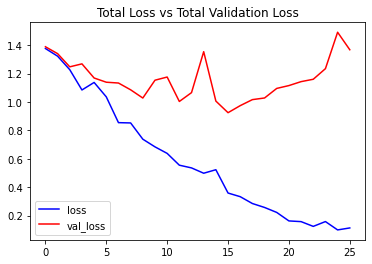

In [ ]:
# Visualize the training and validation loss metrices.
plot_metric(convlstm_model_training_history, 'loss', 'val_loss', 'Total Loss vs Total Validation Loss')

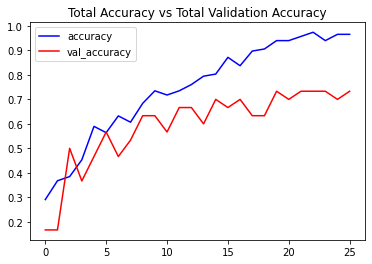

In [ ]:
# Visualize the training and validation accuracy metrices.
plot_metric(convlstm_model_training_history, 'accuracy', 'val_accuracy', 'Total Accuracy vs Total Validation Accuracy') 

# LRCN Approach
In this step, we will implement the LRCN Approach by combining Convolution and LSTM layers in a single model. Another similar approach can be to use a CNN model and LSTM model trained separately. The CNN model can be used to extract spatial features from the frames in the video, and for this purpose, a pre-trained model can be used, that can be fine-tuned for the problem. And the LSTM model can then use the features extracted by CNN, to predict the action being performed in the video. 


But here, we will implement another approach known as the Long-term Recurrent Convolutional Network (LRCN), which combines CNN and LSTM layers in a single model. The Convolutional layers are used for spatial feature extraction from the frames, and the extracted spatial features are fed to LSTM layer(s) at each time-steps for temporal sequence modeling. This way the network learns spatiotemporal features directly in an end-to-end training, resulting in a robust model.

In [ ]:
def create_LRCN_model():
    '''
    This function will construct the required LRCN model.
    Returns:
        model: It is the required constructed LRCN model.
    '''

    # We will use a Sequential model for model construction.
    model = Sequential()
    
    # Define the Model Architecture.
    ########################################################################################################################
    
    model.add(TimeDistributed(Conv2D(16, (3, 3), padding='same',activation = 'relu'),
                              input_shape = (SEQUENCE_LENGTH, image_height, image_width, 3)))
    
    model.add(TimeDistributed(MaxPooling2D((4, 4)))) 
    model.add(TimeDistributed(Dropout(0.25)))
    
    model.add(TimeDistributed(Conv2D(32, (3, 3), padding='same',activation = 'relu')))
    model.add(TimeDistributed(MaxPooling2D((4, 4))))
    model.add(TimeDistributed(Dropout(0.25)))
    
    model.add(TimeDistributed(Conv2D(64, (3, 3), padding='same',activation = 'relu')))
    model.add(TimeDistributed(MaxPooling2D((2, 2))))
    model.add(TimeDistributed(Dropout(0.25)))
    
    model.add(TimeDistributed(Conv2D(64, (3, 3), padding='same',activation = 'relu')))
    model.add(TimeDistributed(MaxPooling2D((2, 2))))
    #model.add(TimeDistributed(Dropout(0.25)))
                                      
    model.add(TimeDistributed(Flatten()))
                                      
    model.add(LSTM(32))
                                      
    model.add(Dense(len(classes_list), activation = 'softmax'))

    ########################################################################################################################

    # Display the models summary.
    model.summary()
    
    # Return the constructed LRCN model.
    return model

In [ ]:
# Construct the required LRCN model.
LRCN_model = create_LRCN_model()

# Display the success message.
print("Model Created Successfully!")

Model: "sequential_4"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 time_distributed_9 (TimeDis  (None, 50, 64, 64, 16)   448       
 tributed)                                                       
                                                                 
 time_distributed_10 (TimeDi  (None, 50, 16, 16, 16)   0         
 stributed)                                                      
                                                                 
 time_distributed_11 (TimeDi  (None, 50, 16, 16, 16)   0         
 stributed)                                                      
                                                                 
 time_distributed_12 (TimeDi  (None, 50, 16, 16, 32)   4640      
 stributed)                                                      
                                                                 
 time_distributed_13 (TimeDi  (None, 50, 4, 4, 32)    

In [ ]:
# Create an Instance of Early Stopping Callback.
early_stopping_callback = EarlyStopping(monitor = 'val_loss', patience = 15, mode = 'min', restore_best_weights = True)
 
# Compile the model and specify loss function, optimizer and metrics to the model.
LRCN_model.compile(loss = 'categorical_crossentropy', optimizer = 'Adam', metrics = ["accuracy"])

# Start training the model.
LRCN_model_training_history = LRCN_model.fit(x = features_train, y = labels_train, epochs = 70, batch_size = 4 ,
                                             shuffle = True, validation_split = 0.2, callbacks = [early_stopping_callback])

Epoch 1/70
30/30 [==============================] - 17s 472ms/step - loss: 1.3945 - accuracy: 0.3419 - val_loss: 1.3853 - val_accuracy: 0.1667
Epoch 2/70
30/30 [==============================] - 13s 441ms/step - loss: 1.3717 - accuracy: 0.3675 - val_loss: 1.4003 - val_accuracy: 0.1667
Epoch 3/70
30/30 [==============================] - 16s 554ms/step - loss: 1.3583 - accuracy: 0.3675 - val_loss: 1.4110 - val_accuracy: 0.1667
Epoch 4/70
30/30 [==============================] - 14s 475ms/step - loss: 1.3479 - accuracy: 0.3675 - val_loss: 1.3814 - val_accuracy: 0.1667
Epoch 5/70
30/30 [==============================] - 14s 465ms/step - loss: 1.3388 - accuracy: 0.3675 - val_loss: 1.4140 - val_accuracy: 0.1667
Epoch 6/70
30/30 [==============================] - 15s 514ms/step - loss: 1.3432 - accuracy: 0.3675 - val_loss: 1.3793 - val_accuracy: 0.2333
Epoch 7/70
30/30 [==============================] - 16s 537ms/step - loss: 1.3050 - accuracy: 0.3932 - val_loss: 1.4379 - val_accuracy: 0.1667

In [ ]:
# Evaluate the trained model.
model_evaluation_history = LRCN_model.evaluate(features_test, labels_test)

2/2 [==============================] - 2s 721ms/step - loss: 0.8898 - accuracy: 0.7959


In [ ]:
# # Get the loss and accuracy from model_evaluation_history.
# model_evaluation_loss, model_evaluation_accuracy = model_evaluation_history

# # Define the string date format.
# # Get the current Date and Time in a DateTime Object.
# # Convert the DateTime object to string according to the style mentioned in date_time_format string.
# date_time_format = '%Y_%m_%d__%H_%M_%S'
# current_date_time_dt = dt.datetime.now()
# current_date_time_string = dt.datetime.strftime(current_date_time_dt, date_time_format)
    
# # Define a useful name for our model to make it easy for us while navigating through multiple saved models.
# model_file_name = f'LRCN_model___Date_Time_{current_date_time_string}___Loss_{model_evaluation_loss}___Accuracy_{model_evaluation_accuracy}.h5'
model_name = f'/content/drive/MyDrive/Projects/Action_Recogn/LRCN_model___seq_{SEQUENCE_LENGTH}_maxImgPerClass_{max_images_per_class}__{image_height}_{image_width}.h5'
# Save the Model.
LRCN_model.save(model_name)

In [ ]:
model = load_model(model_name)

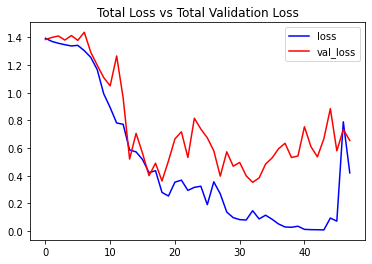

In [ ]:
# Visualize the training and validation loss metrices.
plot_metric(LRCN_model_training_history, 'loss', 'val_loss', 'Total Loss vs Total Validation Loss')

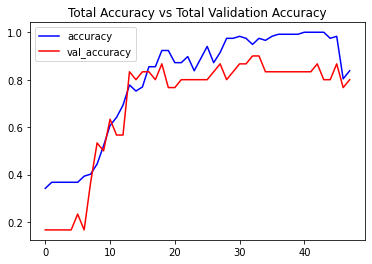

In [ ]:
# Visualize the training and validation accuracy metrices.
plot_metric(LRCN_model_training_history, 'accuracy', 'val_accuracy', 'Total Accuracy vs Total Validation Accuracy')